# Anggota Kelompok
- Thariq Ivan Anendar  (5025221013)
- Wendy Gata Ramadhani (5025221162)
- Ivan Fairuz Adinata  (5025221167)

# Load Library

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

Buat fungsi util:
- Membaca file gambar dari path
- Menyimpan citra RGB
- Menampilkan gambar-gambar dalam bentuk grid
- Menyimpan versi hasil pengolahan citra

In [2]:
def load_rgb(path: str):
    bgr = cv2.imread(path)
    if bgr is None:
        raise FileNotFoundError(f"Tidak bisa load: {path}")
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def save_rgb(img_rgb: np.ndarray, path: str):
    path = str(path)
    bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(path, bgr)

def show_grid(images, titles=None, ncols=4, figsize=(14, 9), suptitle=None):
    titles = titles or [""] * len(images)
    n = len(images)
    nrows = int(np.ceil(n / ncols))
    plt.figure(figsize=figsize)
    if suptitle:
        plt.suptitle(suptitle, fontsize=14)
    for i, (im, t) in enumerate(zip(images, titles), 1):
        ax = plt.subplot(nrows, ncols, i)
        ax.imshow(im)
        ax.set_title(t, fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def save_version(img, name, out_dir="./outputs_spatial"):
    Path(out_dir).mkdir(parents=True, exist_ok=True)
    path = Path(out_dir) / f"{name}.jpg"
    cv2.imwrite(str(path), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    return path


Fungsi util lainnya:
- Melakukan konversi RGB ke grayscale
- Memastikan tipe data adalah uint8
- Mengekstrak channel L (kecerahan)
- Menggabungkan keduanya menjadi tuples
- Menggambar histogram dan CDF dari citra before/after
- Membuat visualisasi histogram dan CDF untuk sepasang gambar (before/after)
- Memvisualisasikan banyak pasangan before/after dalam format grid

In [3]:
def to_gray(img_rgb):
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# ===== helper kecil untuk dipakai ulang =====
def _ensure_uint8_gray(arr):
    """Pastikan array 2D uint8 untuk histogram/CDF."""
    if arr.ndim == 3:
        raise ValueError("Harus grayscale/L-channel, bukan RGB.")
    if arr.dtype != np.uint8:
        arr = np.clip(arr, 0, 255).astype(np.uint8)
    return arr

def to_L(img_rgb):
    """Ambil channel L dari ruang warna Lab (uint8)."""
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)  # OpenCV Lab: L in [0..255]
    L = lab[..., 0]
    return L

def create_after_titles_pairs(imgs_after, titles):
    """Buat list of tuples (title, img_after) dari list of images dan list of titles."""
    if len(imgs_after) != len(titles):
        raise ValueError("Jumlah imgs_after dan titles harus sama.")
    return list(zip(titles, imgs_after))

def draw_hist_cdf_on_axes(before, after, ax_hist, ax_cdf, title_prefix):
    """Gambar Histogram & CDF pada axes yang sudah disediakan."""
    before = _ensure_uint8_gray(before)
    after  = _ensure_uint8_gray(after)
    # Histogram
    ax_hist.hist(before.ravel(), bins=256, range=(0, 255), alpha=0.7, label='Before')
    ax_hist.hist(after.ravel(),  bins=256, range=(0, 255), alpha=0.7, label='After')
    ax_hist.set_xlim(0, 255); ax_hist.set_title(f'{title_prefix} — Histogram'); ax_hist.legend()

    # CDF
    def cdf(arr):
        hist, _ = np.histogram(arr.ravel(), 256, [0, 256])
        cs = hist.cumsum().astype(np.float64)
        cs /= cs[-1] if cs[-1] != 0 else 1.0
        return cs
    c1, c2 = cdf(before), cdf(after)
    ax_cdf.plot(np.arange(256), c1, label='Before')
    ax_cdf.plot(np.arange(256), c2, label='After')
    ax_cdf.set_xlim(0, 255); ax_cdf.set_ylim(0, 1.0)
    ax_cdf.set_title(f'{title_prefix} — CDF'); ax_cdf.legend()

# ===== fungsi single pair (pakai figur terpisah seperti punyamu) =====
def plot_hist_cdf(imgs_before, imgs_after, title_prefix, mode):
    """img_*: grayscale uint8 (mode='gray') atau channel-L uint8 (mode='lab').
       untuk 'lab', histogram/CDF dihitung pada channel L saja."""
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    axes[0].hist(imgs_before.ravel(), bins=256, range=(0,255), alpha=0.7, label='Before')
    axes[0].hist(imgs_after.ravel(),  bins=256, range=(0,255), alpha=0.7, label='After')
    axes[0].set_title(f'{title_prefix} — Histogram')
    axes[0].set_xlim(0,255); axes[0].legend()

    def cdf(arr):
        hist, _ = np.histogram(arr.ravel(), 256, [0,256])
        cs = hist.cumsum().astype(np.float64)
        cs /= cs[-1]
        return cs
    c1, c2 = cdf(imgs_before), cdf(imgs_after)
    axes[1].plot(np.arange(256), c1, label='Before')
    axes[1].plot(np.arange(256), c2, label='After')
    axes[1].set_title(f'{title_prefix} — CDF')
    axes[1].set_xlim(0,255); axes[1].legend()
    fig.tight_layout()
    plt.show()

# ===== fungsi GRID untuk banyak pasangan before/after =====
def plot_before_after_hist_grid(before, imgs_after, mode='gray', suptitle=None, show_axes=False):
    """
    Tampilkan grid: per-baris = [Before image | After image | Histogram | CDF].
    - pairs: list of tuples (title, img_before_rgb, img_after_rgb)
    - mode : 'gray' -> histogram dari to_gray(); 'lab' -> histogram dari channel L (Lab)
    - suptitle: judul besar (opsional)
    - show_axes: jika False, matikan ticks pada kolom gambar
    """
    n = len(imgs_after)
    if n == 0:
        raise ValueError("pairs kosong.")

    fig, axes = plt.subplots(n, 4, figsize=(16, 4*n))
    if n == 1:
        axes = np.expand_dims(axes, 0)  # uniformisasi jadi (n, 4)

    for i, (title, img_a) in enumerate(imgs_after):
        # kolom 0-1: gambar before/after
        ax_b, ax_a, ax_h, ax_c = axes[i]
        ax_b.imshow(before); ax_b.set_title(f"{title} — Before")
        ax_a.imshow(img_a); ax_a.set_title(f"{title} — After")
        if not show_axes:
            for ax in (ax_b, ax_a):
                ax.set_xticks([]); ax.set_yticks([])

        # siapkan data grayscale/L
        if mode == 'gray':
            arr_b = to_gray(before)
            arr_a = to_gray(img_a)
            title_prefix = f"{title} (Gray)"
        elif mode == 'lab':
            arr_b = to_L(before)
            arr_a = to_L(img_a)
            title_prefix = f"{title} (Lab L)"
        else:
            raise ValueError("mode harus 'gray' atau 'lab'.")

        # kolom 2-3: histogram & CDF
        draw_hist_cdf_on_axes(arr_b, arr_a, ax_h, ax_c, title_prefix)

    if suptitle:
        fig.suptitle(suptitle, y=0.995, fontsize=14)
    fig.tight_layout()
    plt.show()


# Load Data and Preview

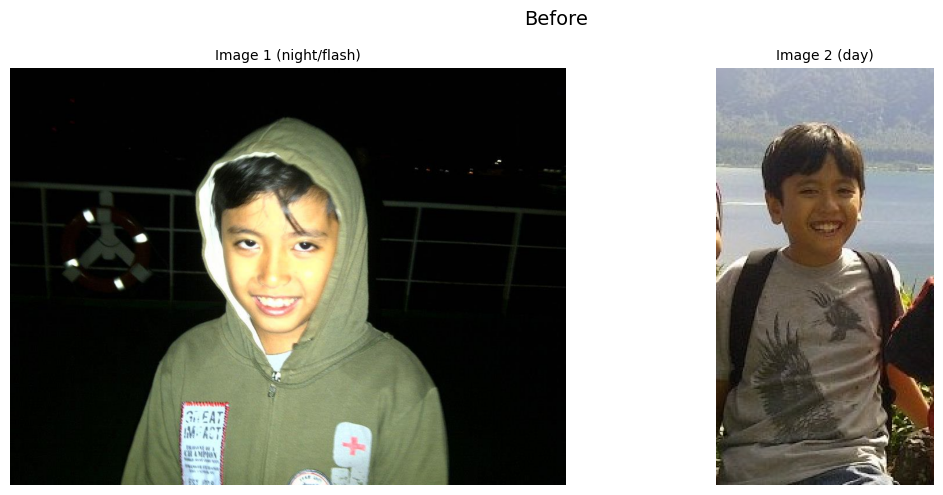

In [4]:
# Path file
IMG1_PATH = "image2.jpg"
IMG2_PATH = "image1.jpg"

# Folder output
OUT_DIR = Path("./outputs_spatial")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# Parameter sweep (bebas diubah)
CLAHE_PARAMS = [(1.0, 8), (1.6, 8), (2.0, 8), (3.0, 8), (2.0, 4), (2.0, 12)]
UNSHARP_PARAMS = [(1, 0.5), (2, 0.8), (3, 1.0), (5, 1.2)]
BILATERAL_PARAMS = [(7, 30, 30), (9, 50, 50), (11, 70, 70)]
MEDIAN_PARAMS = [3, 5, 7]
GAMMA_VALS = [0.8, 1.0, 1.2, 1.4]
CS_PARAMS = [(2, 98), (1, 99), (0.5, 99.5)]  # (low_percent, high_percent)

# Load
img1 = load_rgb(IMG1_PATH)
img2 = load_rgb(IMG2_PATH)

show_grid([img1, img2], ["Image 1 (night/flash)", "Image 2 (day)"], ncols=2, figsize=(12,5), suptitle="Before")


In [5]:
def gamma_correction(img_rgb, gamma=1.0):
    inv = 1.0 / max(gamma, 1e-6)
    table = (np.arange(256) / 255.0) ** inv
    table = np.clip(table * 255.0, 0, 255).astype(np.uint8)
    return cv2.LUT(img_rgb, table)

def contrast_stretch(img_rgb, low_percent=1, high_percent=99):
    out = img_rgb.copy().astype(np.float32)
    for c in range(3):
        lo = np.percentile(out[..., c], low_percent)
        hi = np.percentile(out[..., c], high_percent)
        if hi - lo < 1e-6:
            continue
        out[..., c] = (out[..., c] - lo) * (255.0 / (hi - lo))
        out[..., c] = np.clip(out[..., c], 0, 255)
    return out.astype(np.uint8)

def clahe_on_luma(img_rgb, clip_limit=2.0, tile_grid_size=8):
    ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    Y, Cr, Cb = cv2.split(ycrcb)
    clahe = cv2.createCLAHE(clipLimit=float(clip_limit),
                            tileGridSize=(int(tile_grid_size), int(tile_grid_size)))
    Y2 = clahe.apply(Y)
    return cv2.cvtColor(cv2.merge([Y2, Cr, Cb]), cv2.COLOR_YCrCb2RGB)

def unsharp_mask(img_rgb, radius=3, amount=1.0):
    ksize = max(1, int(radius) * 2 + 1)
    blur = cv2.GaussianBlur(img_rgb, (ksize, ksize), 0)
    return cv2.addWeighted(img_rgb, 1 + float(amount), blur, -float(amount), 0)

def bilateral_denoise(img_rgb, d=9, sigmaColor=50, sigmaSpace=50):
    return cv2.bilateralFilter(img_rgb, int(d), float(sigmaColor), float(sigmaSpace))

def median_denoise(img_rgb, ksize=3):
    k = int(ksize) if int(ksize) % 2 == 1 else int(ksize) + 1
    return cv2.medianBlur(img_rgb, k)


# Metode 1 - Parameter Sweep – CLAHE

Alur Kerja
1. Fungsi sweep_clahe() mengiterasi berbagai kombinasi parameter CLAHE:
- ```clip_limit```: membatasi kontras maksimum untuk mencegah penguatan noise
- ```tile_grid_size```: ukuran grid untuk adaptasi lokal pada citra
2. Untuk setiap kombinasi parameter:
- Algoritma CLAHE diterapkan pada citra dengan fungsi ```clahe_on_luma()```
- Hasil disimpan dengan nama yang menunjukkan parameter yang digunakan
- Citra hasil dan judulnya ditambahkan ke dalam daftar untuk visualisasi
3. Visualisasi hasil:
- Menggunakan ```plot_before_after_hist_grid()``` untuk membuat grid perbandingan
- Grid menampilkan: citra asli, citra hasil CLAHE, histogram, dan CDF (Cumulative
Distribution Function)
- Analisis dilakukan pada channel L (Luminance/kecerahan) dari ruang warna Lab
4. Proses dilakukan pada dua citra:
- img1: citra gelap (malam hari)
- img2: citra terang (siang hari)

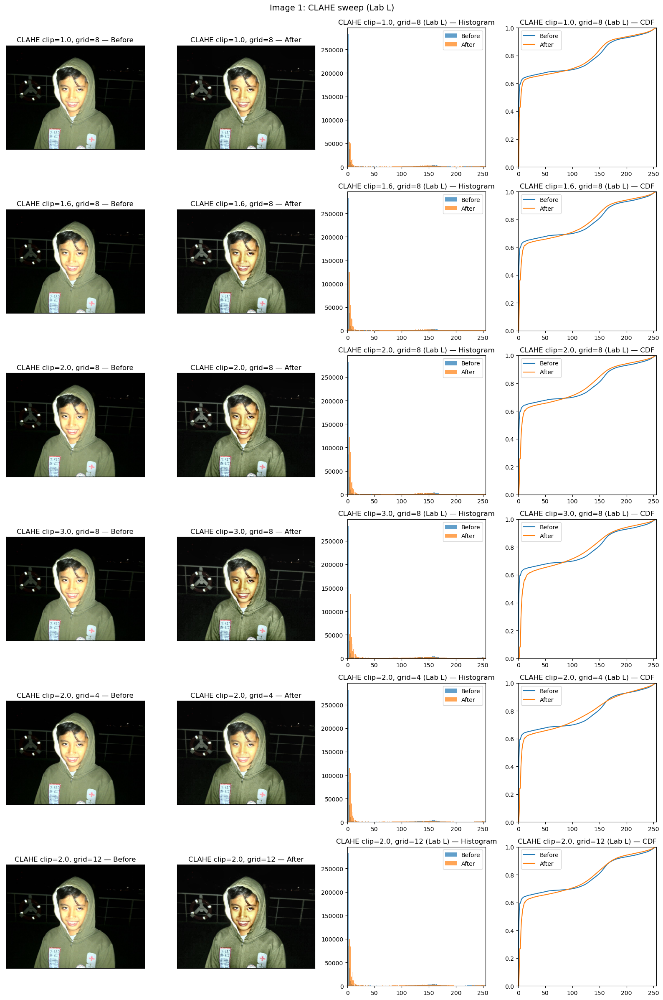

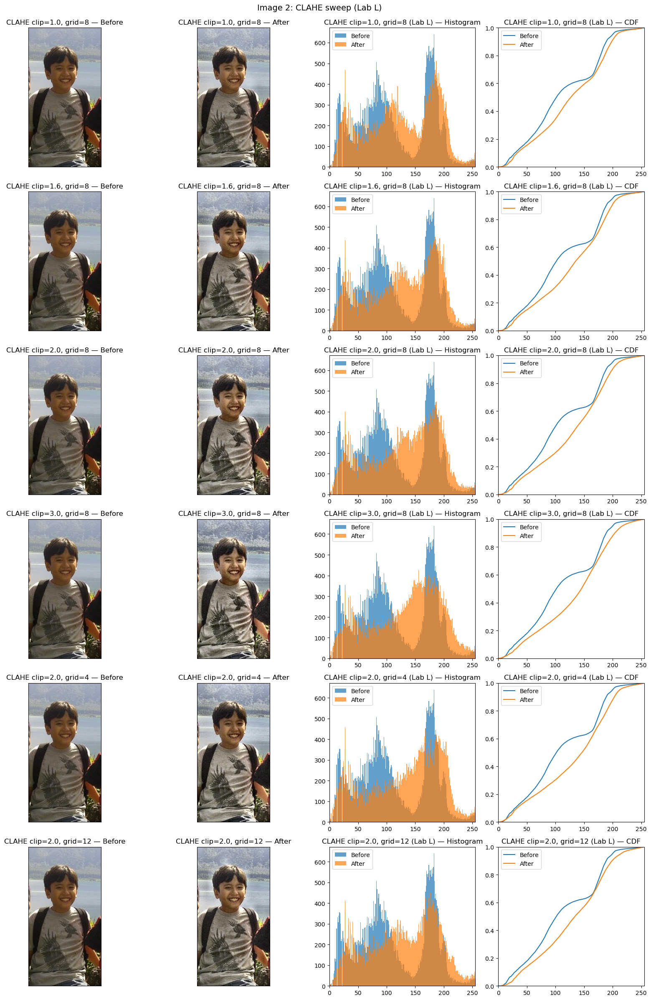

In [6]:
def sweep_clahe(img, params, prefix="img1_clahe", out_dir="./outputs_spatial"):
    ims, titles = [img], ["Original"]
    for cl, grid in params:
        out = clahe_on_luma(img, cl, grid)
        name = f"{prefix}_clip{cl}_grid{grid}"
        ims.append(out)
        titles.append(f"CLAHE clip={cl}, grid={grid}")
    save_version(out, name, out_dir)
    return ims, titles

imgs, titles = sweep_clahe(img1, CLAHE_PARAMS, prefix="image1_clahe")
plot_before_after_hist_grid(img1, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 1: CLAHE sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 1: CLAHE sweep")

imgs, titles = sweep_clahe(img2, CLAHE_PARAMS, prefix="image2_clahe")
plot_before_after_hist_grid(img2, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 2: CLAHE sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 2: CLAHE sweep")


# Method 2 - Parameter Sweep – Unsharp Mask

Alur Kerja
1. Fungsi sweep_unsharp() mengiterasi berbagai kombinasi parameter Unsharp Mask:
- ```radius (r)```: menentukan ukuran kernel Gaussian blur (ksize = 2*radius+1)
- ```amount (a)```: mengatur intensitas efek penajaman
2. Untuk setiap kombinasi parameter:
- Algoritma Unsharp Mask diterapkan pada citra melalui fungsi ```unsharp_mask()```
- Hasil disimpan dengan nama file yang mengindikasikan parameter yang digunakan
- Citra hasil dan judulnya ditambahkan ke dalam daftar untuk visualisasi
3. Proses Unsharp Mask:
- Membuat versi blur dari gambar asli
- Menghitung perbedaan antara gambar asli dan versi blur
- Menambahkan perbedaan ini
- kembali ke gambar asli dengan faktor pengali (amount)
- Formula: output = original*(1+amount) - blur*amount
4. Visualisasi hasil:
- Menggunakan ```plot_before_after_hist_grid()``` untuk membuat grid perbandingan
- Menampilkan gambar asli, hasil Unsharp Mask, histogram, dan CDF
- Analisis dilakukan pada channel L (kecerahan) dari ruang warna Lab
5. Proses dilakukan pada dua citra:
- img1: citra gelap (malam/flash)
- img2: citra terang (siang)

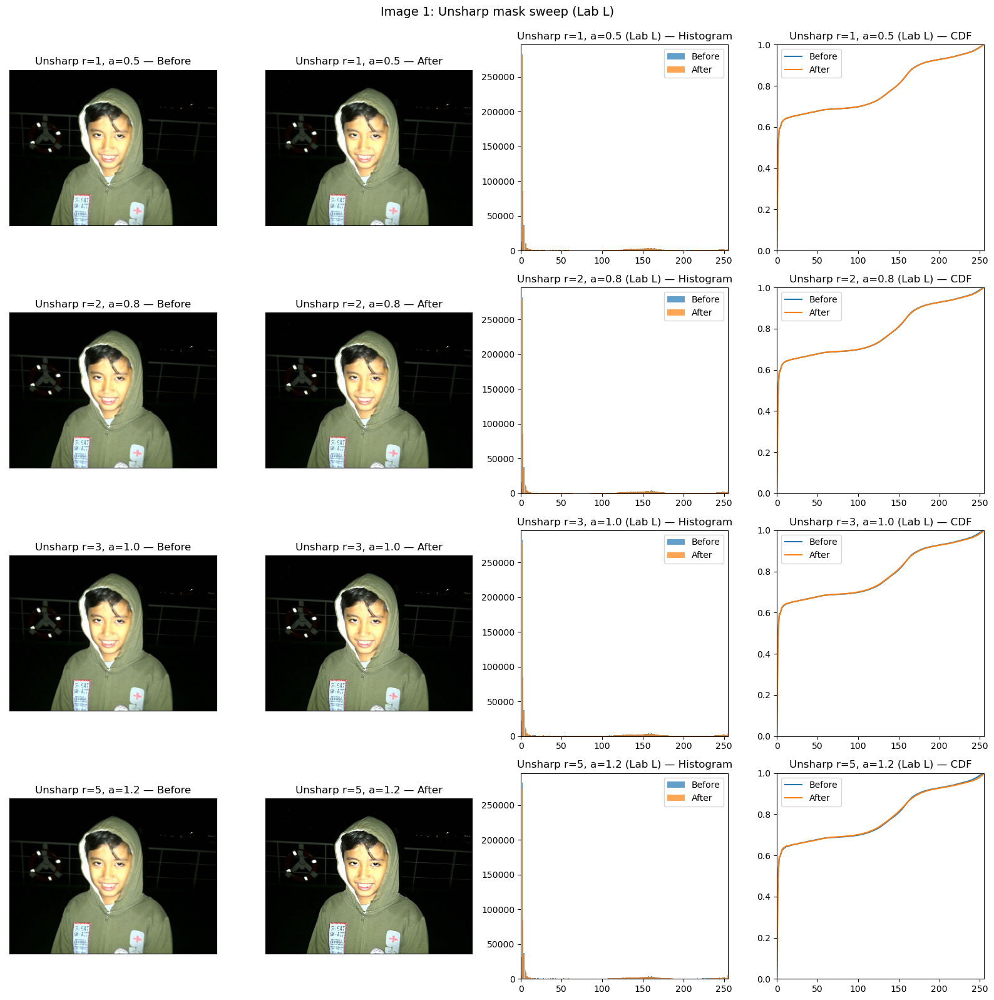

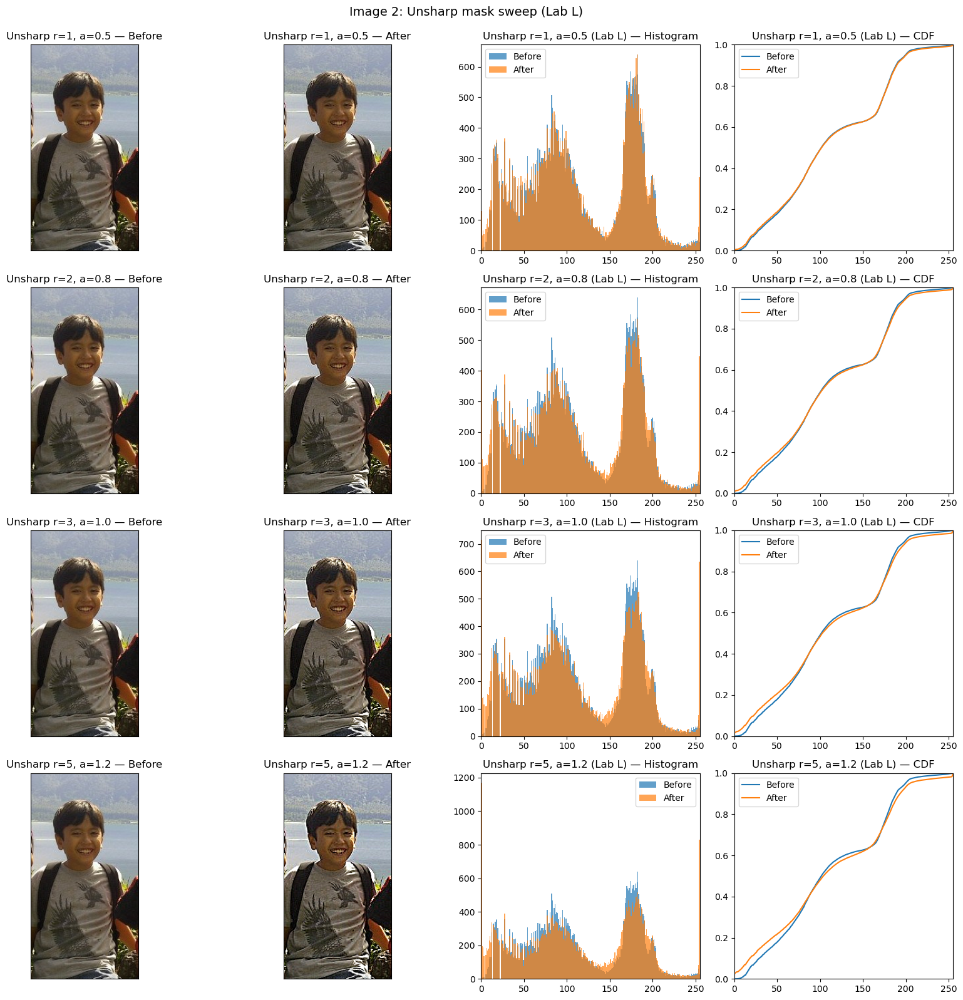

In [7]:
def sweep_unsharp(img, params, prefix="img1_unsharp", out_dir="./outputs_spatial"):
    ims = [img]
    titles = ["Original"]
    for r, a in params:
        out = unsharp_mask(img, r, a)
        name = f"{prefix}_r{r}_a{a}"
        save_version(out, name, out_dir)
        ims.append(out)
        titles.append(f"Unsharp r={r}, a={a}")
    return ims, titles

imgs, titles = sweep_unsharp(img1, UNSHARP_PARAMS)
plot_before_after_hist_grid(img1, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 1: Unsharp mask sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 1: Unsharp mask sweep")

imgs, titles = sweep_unsharp(img2, UNSHARP_PARAMS)
plot_before_after_hist_grid(img2, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 2: Unsharp mask sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 2: Unsharp mask sweep")


# Method 3 - Parameter Sweep – Gamma & Strech

Alur Kerja Gamma Correction & Contrast Stretching:
1. Fungsi sweep_gamma() mengiterasi berbagai nilai gamma:
- Parameter ```gammas```: berbagai nilai gamma untuk diuji (GAMMA_VALS = [0.8, 1.0, 1.2, 1.4])
- Untuk setiap nilai gamma, fungsi ```gamma_correction()``` diterapkan pada citra
- Hasil dan judul disimpan dalam daftar untuk visualisasi
2. Fungsi sweep_contrast_stretch() mengiterasi berbagai parameter persentil:
- Parameter ```cs_params```: kombinasi persentil rendah dan tinggi (CS_PARAMS = [(2, 98), (1, 99), (0.5, 99.5)])
- Untuk setiap pasangan nilai persentil, fungsi ```contrast_stretch()``` diterapkan pada citra
- Hasil dan judul disimpan dalam daftar untuk visualisasi
3. Proses Gamma Correction:
- Mengubah intensitas piksel dengan formula: output = input^(1/gamma)
- Gamma < 1: meningkatkan brightness di area gelap (mencerahkan gambar)
- Gamma > 1: mengurangi brightness di area terang (menggelapkan gambar)
- Gamma = 1: tidak ada perubahan
4. Proses Contrast Stretching:
- Merentangkan histogram intensitas citra antara persentil rendah dan tinggi
- Parameter ```low_percent```: titik persentil bawah (misal: 1% piksel terbawah dianggap hitam)
- Parameter ```high_percent```: titik persentil atas (misal: 99% piksel teratas dianggap putih)
- Intensitas piksel di antara keduanya direntangkan secara linear ke rentang [0, 255]
5. Visualisasi hasil menggunakan grid perbandingan yang menunjukkan gambar asli, hasil, histogram, dan CDF, dengan analisis pada channel kecerahan (L) dari ruang warna Lab.

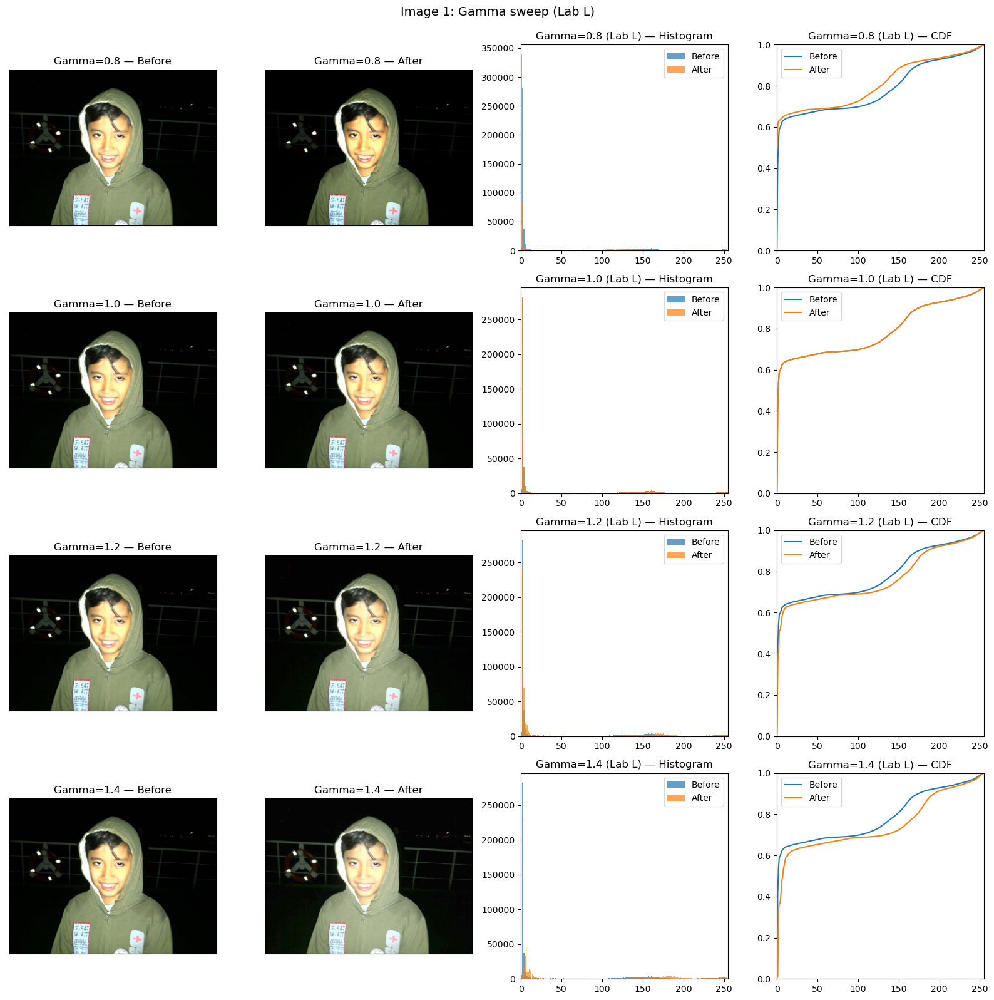

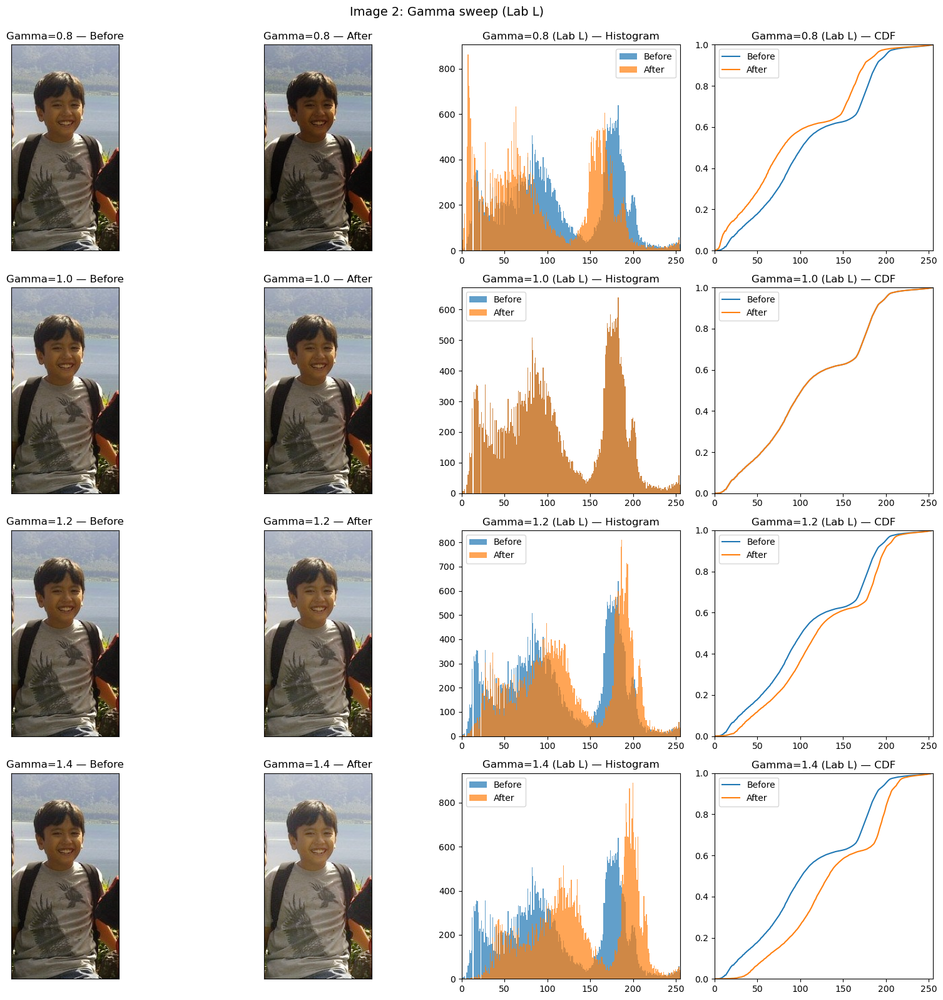

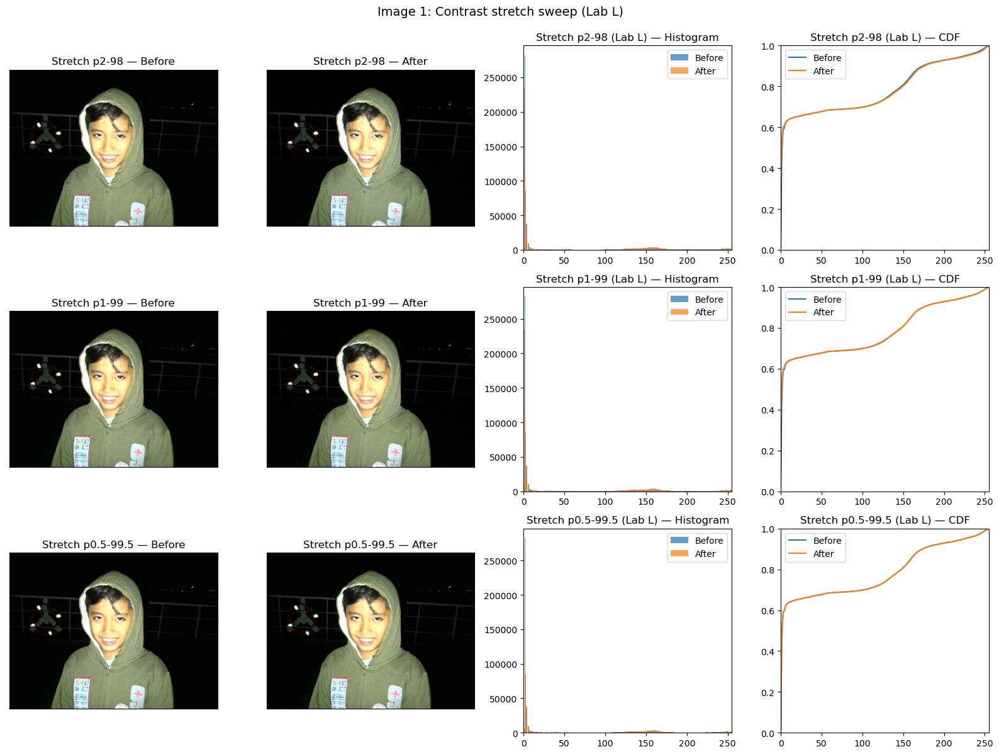

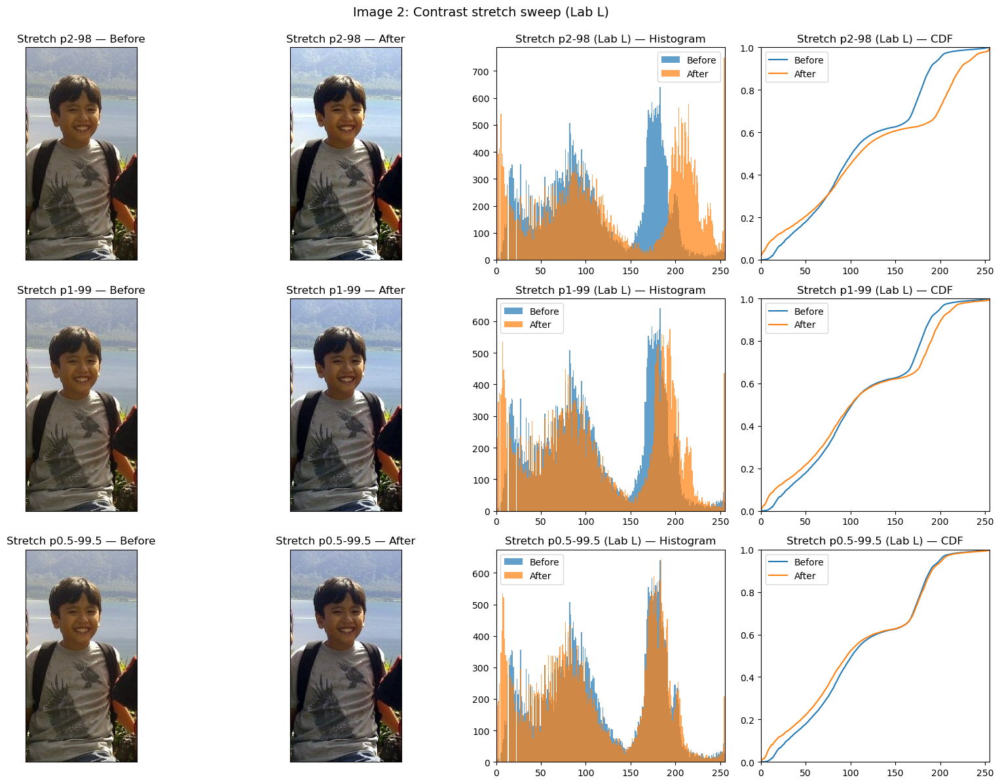

In [8]:
def sweep_gamma(img, gammas):
    ims = [img]
    titles = ["Original"]
    for g in gammas:
        ims.append(gamma_correction(img, g))
        titles.append(f"Gamma={g}")
    return ims, titles

def sweep_contrast_stretch(img, cs_params):
    ims = [img]
    titles = ["Original"]
    for lp, hp in cs_params:
        ims.append(contrast_stretch(img, lp, hp))
        titles.append(f"Stretch p{lp}-{hp}")
    return ims, titles

imgs, titles = sweep_gamma(img1, GAMMA_VALS)
plot_before_after_hist_grid(img1, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 1: Gamma sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 1: Gamma sweep")

imgs, titles = sweep_gamma(img2, GAMMA_VALS)
plot_before_after_hist_grid(img2, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 2: Gamma sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 2: Gamma sweep")

imgs, titles = sweep_contrast_stretch(img1, CS_PARAMS)
plot_before_after_hist_grid(img1, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 1: Contrast stretch sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 1: Contrast stretch sweep")

imgs, titles = sweep_contrast_stretch(img2, CS_PARAMS)
plot_before_after_hist_grid(img2, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 2: Contrast stretch sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 2: Contrast stretch sweep")


# Method 4 - Parameter Sweep – Denoise (Bilateral & Median)

### Alur Kerja
Metode ini melakukan denoising pada gambar menggunakan *Bilateral filter* dan *Median filter* dengan berbagai kombinasi parameter. Hasil setiap kombinasi kemudian dibandingkan secara visual menggunakan histogram dan citra.

1. *Baca Gambar*
   - Ambil gambar input (img).
   - Simpan versi asli sebagai referensi.

2. *Tentukan Parameter*
   - Daftar parameter untuk *Bilateral filter*:
     - d (diameter pixel tetangga).
     - sigmaColor (rentang warna).
     - sigmaSpace (jarak spasial).
   - Daftar parameter untuk *Median filter*:
     - k (ukuran kernel).

3. *Looping Setiap Kombinasi Parameter*
   - Terapkan *Bilateral filter* pada gambar dengan setiap set parameter.
   - Terapkan *Median filter* dengan setiap nilai kernel.
   - Simpan hasil citra dan beri label sesuai parameter yang digunakan.

4. *Kumpulkan Hasil*
   - Buat list berisi semua citra hasil denoise (original + semua variasi).
   - Buat list judul sesuai parameter (contoh: Bilateral d=9, sC=75, sS=75 atau Median k=5).

5. *Tampilkan Hasil*
   - Visualisasikan perbandingan:
     - *Histogram & citra sebelum-sesudah* menggunakan plot_before_after_hist_grid.
     - (Opsional) *Grid semua hasil* menggunakan show_grid.

6. *Aplikasi pada Dua Gambar*
   - Jalankan metode ini pada img1 dan tampilkan hasilnya.
   - Jalankan metode ini pada img2 dan tampilkan hasilnya.

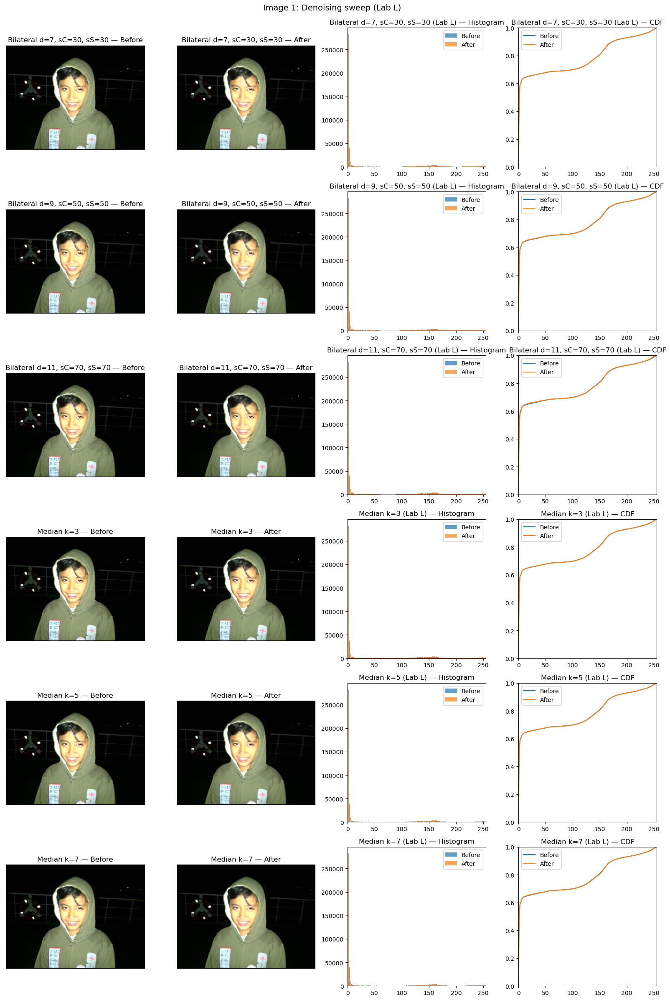

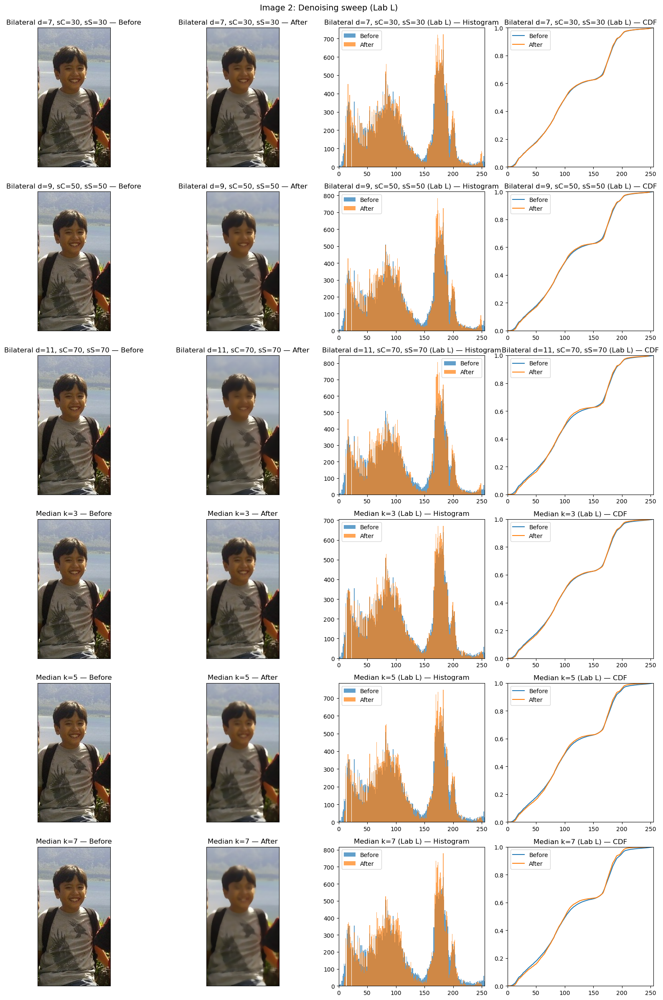

In [9]:
def sweep_denoise(img, bilateral_params, median_params):
    ims = [img]
    titles = ["Original"]
    for d, sc, ss in bilateral_params:
        ims.append(bilateral_denoise(img, d, sc, ss))
        titles.append(f"Bilateral d={d}, sC={sc}, sS={ss}")
    for k in median_params:
        ims.append(median_denoise(img, k))
        titles.append(f"Median k={k}")
    return ims, titles

imgs, titles = sweep_denoise(img1, BILATERAL_PARAMS, MEDIAN_PARAMS)
plot_before_after_hist_grid(img1, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 1: Denoising sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 1: Denoising sweep")

imgs, titles = sweep_denoise(img2, BILATERAL_PARAMS, MEDIAN_PARAMS)
plot_before_after_hist_grid(img2, create_after_titles_pairs(imgs[1:], titles[1:]), mode='lab', suptitle="Image 2: Denoising sweep (Lab L)", show_axes=False)
# show_grid(imgs, titles, ncols=3, suptitle="Image 2: Denoising sweep")


# Result

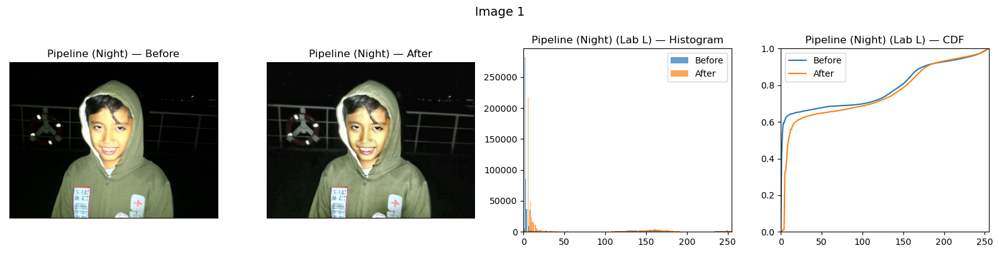

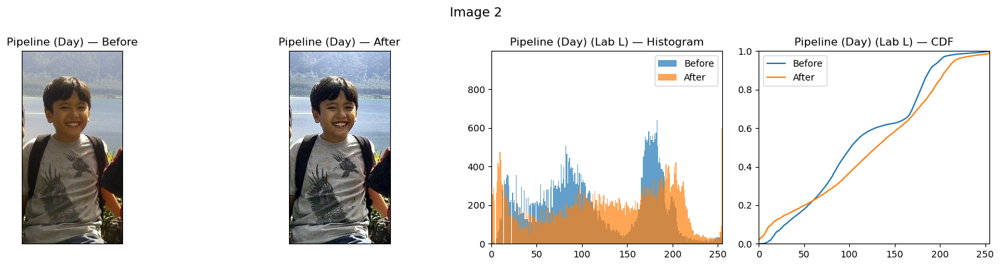

Saved:
- outputs_spatial\image1_night_enhanced.jpg
- outputs_spatial\image2_day_enhanced.jpg


In [24]:

def pipeline_night(img):
    # Malam/flash: denoise -> CLAHE (rendah) -> unsharp ringan -> gamma > 1 (gelapkan highlight)
    a = bilateral_denoise(img, d=9, sigmaColor=50, sigmaSpace=50)
    b = clahe_on_luma(a, clip_limit=1.8, tile_grid_size=8)
    c = unsharp_mask(b, radius=2, amount=0.7)
    d = gamma_correction(c, gamma=1.2)
    return d

def pipeline_day(img):
    # Siang: CLAHE -> contrast stretch -> unsharp
    a = clahe_on_luma(img, clip_limit=1.0, tile_grid_size=4)
    b = contrast_stretch(a, low_percent=1, high_percent=99)
    c = unsharp_mask(b, radius=1, amount=0.5)
    return c

enh1 = pipeline_night(img1)
enh2 = pipeline_day(img2)

# Simpan
out1 = OUT_DIR / "image1_night_enhanced.jpg"
out2 = OUT_DIR / "image2_day_enhanced.jpg"
save_rgb(enh1, out1)
save_rgb(enh2, out2)

# Tampilkan before/after
plot_before_after_hist_grid(img1, create_after_titles_pairs([enh1], ["Pipeline (Night)"]), mode='lab', suptitle="Image 1", show_axes=False)
plot_before_after_hist_grid(img2, create_after_titles_pairs([enh2], ["Pipeline (Day)"]), mode='lab', suptitle="Image 2", show_axes=False)
# show_grid([img1, enh1], ["Original", "Pipeline (Night)"], ncols=2, figsize=(10,5), suptitle="Image 1")
# show_grid([img2, enh2], ["Original", "Pipeline (Day)"], ncols=2, figsize=(10,5), suptitle="Image 2")

print("Saved:")
print("-", out1)
print("-", out2)


# Method 5 - Parameter sweep - high pass filtering

### Alur Kerja High-Pass Filtering (Laplacian)

metode ini melakukan high-pass filtering pada gambar menggunakan Laplacian filter untuk memperkuat tepi dan detail. Hasilnya dievaluasi dengan metrik MSE, PSNR, dan SSIM untuk membandingkan kualitas setiap kombinasi parameter.

1. **Baca Gambar**
   - Buka file gambar.
   - Konversi gambar menjadi grayscale.

2. **Tentukan Parameter**
   - Pilih beberapa nilai **kernel size** untuk Laplacian.
   - Pilih beberapa nilai **scale** untuk memperkuat efek high-pass.

3. **Looping Setiap Kombinasi Parameter**
   - Terapkan **Laplacian filter** pada gambar grayscale.
   - Tambahkan hasil filter ke citra asli dengan faktor **scale**.
   - Simpan citra hasil enhancement.
   - Hitung **metrik kualitas**:
     - **MSE (Mean Squared Error)**
     - **PSNR (Peak Signal-to-Noise Ratio)**
     - **SSIM (Structural Similarity Index)**
   - Simpan hasil metrik untuk setiap kombinasi parameter.

4. **Tampilkan Hasil Citra**
   - Buat grid dari semua citra hasil.
   - Beri label sesuai kombinasi parameter (**kernel size** & **scale**).

5. **Plot Metrik Evaluasi**
   - Buat grafik perbandingan MSE, PSNR, dan SSIM.
   - Bandingkan kualitas hasil filtering di setiap kombinasi parameter.



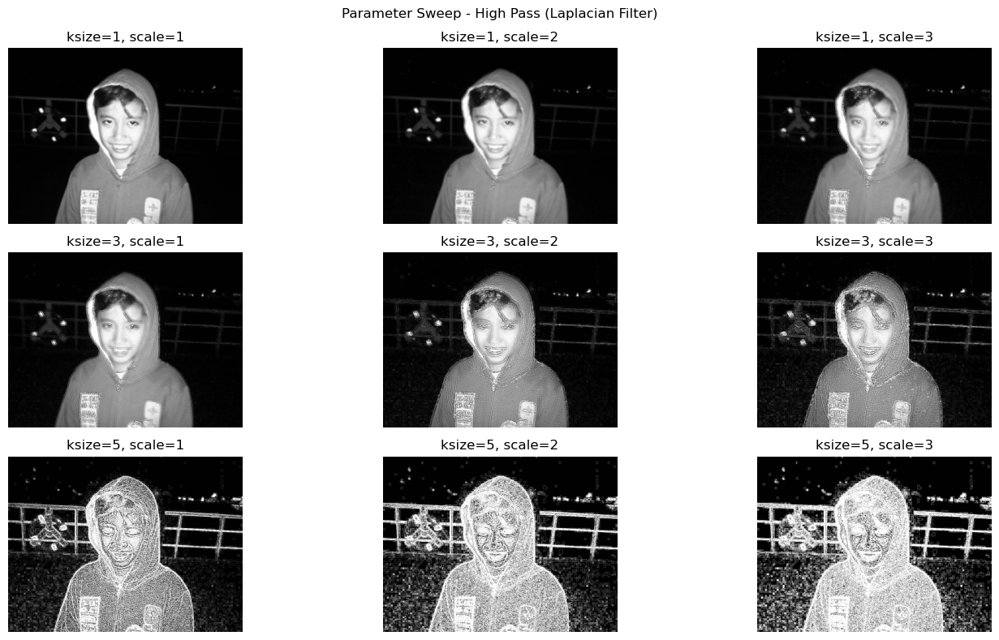

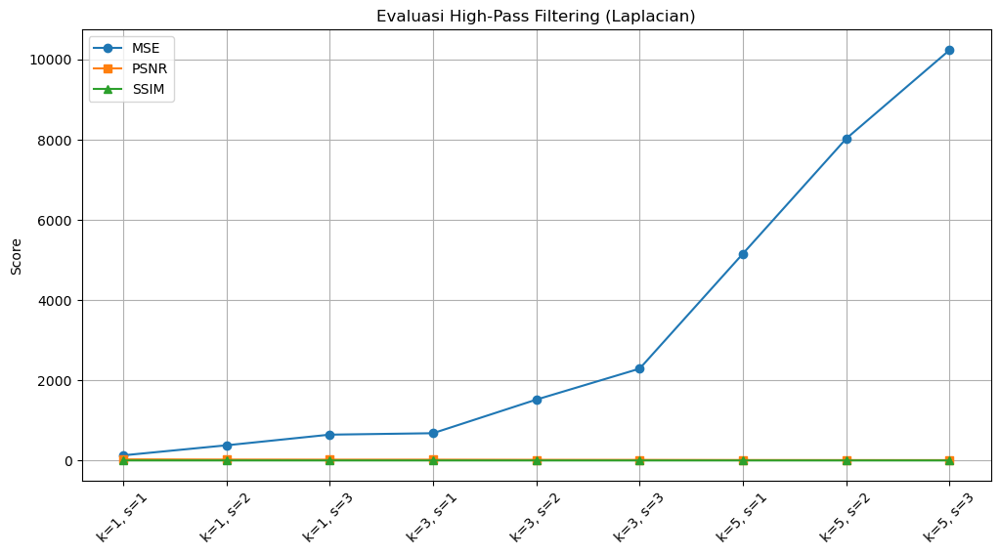

In [17]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity as ssim

# ---- Ganti dengan path gambar lokal ----
img_path = "image2.jpg"  # ganti dengan nama file lokal kamu
img = cv2.imread(img_path)  # baca gambar
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # konversi ke grayscale

# Parameter sweep: kombinasi kernel size dan scale
ksizes = [1, 3, 5]
scales = [1, 2, 3]

# Simpan hasil citra & metrik
results = []
images = []

for k in ksizes:
    for scale in scales:
        # Laplacian filter
        lap = cv2.Laplacian(img_gray, cv2.CV_64F, ksize=k)
        laplacian_enhanced = cv2.convertScaleAbs(img_gray + scale * lap)

        # Simpan citra hasil
        images.append((f"ksize={k}, scale={scale}", laplacian_enhanced))

        # Hitung metrik
        mse_val = mean_squared_error(img_gray, laplacian_enhanced)
        psnr_val = peak_signal_noise_ratio(img_gray, laplacian_enhanced, data_range=255)
        ssim_val = ssim(img_gray, laplacian_enhanced, data_range=255)

        results.append((f"k={k}, s={scale}", mse_val, psnr_val, ssim_val))

fig, axes = plt.subplots(len(ksizes), len(scales), figsize=(15, 8))
for idx, (label, img_out) in enumerate(images):
    ax = axes[idx // len(scales), idx % len(scales)]
    ax.imshow(img_out, cmap='gray')
    ax.set_title(label)
    ax.axis("off")
plt.suptitle("Parameter Sweep - High Pass (Laplacian Filter)")
plt.tight_layout()
plt.show()

labels, mse_vals, psnr_vals, ssim_vals = zip(*results)

x = np.arange(len(labels))

plt.figure(figsize=(12,6))
plt.plot(x, mse_vals, marker='o', label="MSE")
plt.plot(x, psnr_vals, marker='s', label="PSNR")
plt.plot(x, ssim_vals, marker='^', label="SSIM")
plt.xticks(x, labels, rotation=45)
plt.title("Evaluasi High-Pass Filtering (Laplacian)")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.show()


# Metode 6 - Parameter Sweep - Sobel Filter

### Alur Kerja Sobel Edge Detection dengan Histogram dan CDF

Kode ini melakukan deteksi tepi menggunakan Sobel filter pada arah X dan Y, kemudian menghitung magnitudo gradien. Untuk setiap hasil, juga dibuat histogram intensitas dan CDF (cumulative distribution function) untuk analisis distribusi piksel.

1. **Baca Gambar**
   - Buka file gambar.
   - Konversi gambar menjadi grayscale.

2. **Tentukan Parameter**
   - Pilih beberapa nilai **kernel size** (`ksize`) untuk filter Sobel.

3. **Looping Setiap Kernel Size**
   - Terapkan **Sobel filter** pada arah X dan Y:
     - `Sobel X` → mendeteksi tepi vertikal.
     - `Sobel Y` → mendeteksi tepi horizontal.
   - Hitung **magnitudo gradien** dari Sobel X dan Y.
   - Konversi hasil menjadi tipe 8-bit untuk ditampilkan.

4. **Hitung Histogram dan CDF**
   - **Histogram** → jumlah piksel untuk setiap nilai intensitas (0–255).
   - **CDF (Cumulative Distribution Function)** → kumulatif histogram untuk analisis distribusi intensitas.
   - Normalisasi CDF agar sebanding dengan histogram.

5. **Tampilkan Hasil**
   - **Gambar Sobel** untuk setiap kernel size.
   - **Histogram** hasil Sobel.
   - **Histogram + CDF** pada satu plot.


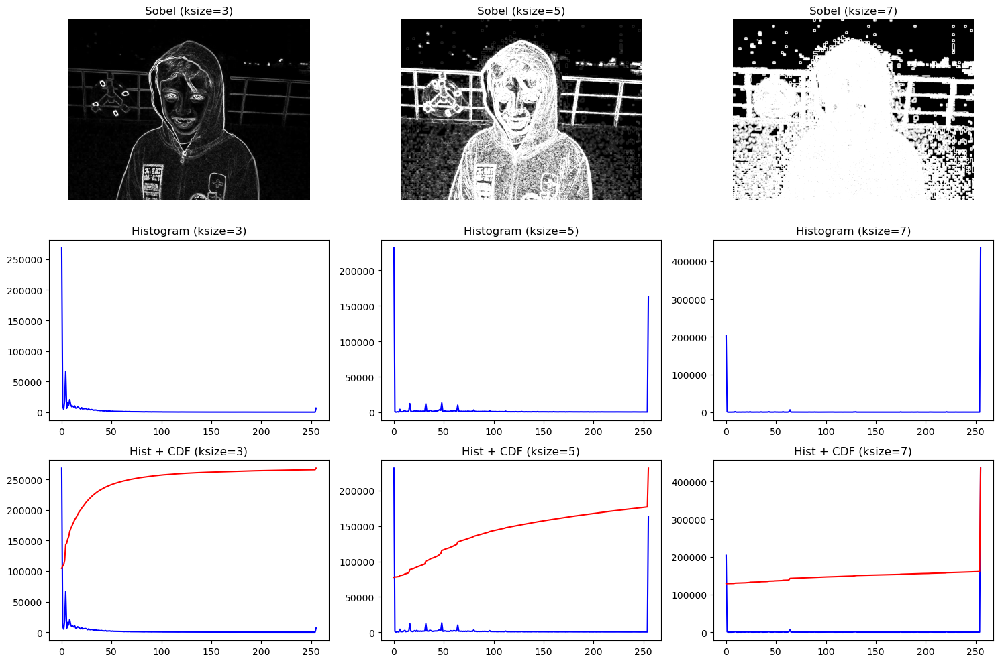

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_path = "image2.jpg"  # ganti sesuai nama file lokal
img = cv2.imread(img_path)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Daftar kernel size untuk Sobel
ksizes = [3, 5, 7]

plt.figure(figsize=(15, 10))

for i, k in enumerate(ksizes, 1):
    # Sobel X dan Y
    sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=k)
    sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=k)
    sobel = cv2.magnitude(sobelx, sobely)
    sobel = cv2.convertScaleAbs(sobel)

    # Histogram
    hist, bins = np.histogram(sobel.flatten(), 256, [0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    # Tampilkan hasil Sobel
    plt.subplot(3, len(ksizes), i)
    plt.imshow(sobel, cmap="gray")
    plt.title(f"Sobel (ksize={k})")
    plt.axis("off")

    # Histogram
    plt.subplot(3, len(ksizes), i+len(ksizes))
    plt.plot(hist, color="blue")
    plt.title(f"Histogram (ksize={k})")

    # Histogram + CDF
    plt.subplot(3, len(ksizes), i+2*len(ksizes))
    plt.plot(hist, color="blue")
    plt.plot(cdf_normalized, color="red")
    plt.title(f"Hist + CDF (ksize={k})")

plt.tight_layout()
plt.show()
